<a href="https://colab.research.google.com/github/Christophe-Arendt/music_classif/blob/main/LSTM_Attention_Model_for_Music_Generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#LSTM-Attention Model for Music Generation

---



In [1]:
import os
import pickle
import numpy as np
from music21 import note, chord, corpus, converter, stream, instrument
import glob
from tensorflow.keras.utils import to_categorical
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

In [2]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import LSTM, Input, Dropout, Dense, Activation, Embedding, Concatenate, Reshape
from tensorflow.keras.layers import Flatten, RepeatVector, Permute, TimeDistributed
from tensorflow.keras.layers import Multiply, Lambda, Softmax
import tensorflow.keras.backend as K 
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import RMSprop

📌 [Download data here](https://github.com/PacktPublishing/Hands-On-Generative-AI-with-Python-and-TensorFlow-2/blob/master/Chapter_11/lstm_attention/midi_dataset.zip)

In [175]:
# upload midi_dataset.zip file beforehand
!unzip midi_dataset.zip


Archive:  midi_dataset.zip
replace midi_dataset/Waltz No.9.mid? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

## Get Dataset

In [60]:
data_dir = 'midi_dataset'

# list of files
midi_list = os.listdir(data_dir)

# Load and make list of stream objects
original_scores = []
for midi in tqdm(midi_list):
    score = converter.parse(os.path.join(data_dir,midi))
    original_scores.append(score)

  0%|          | 0/99 [00:00<?, ?it/s]

## Merge Notes to Chords

In [61]:
# Merge notes into chords
original_scores = [midi.chordify() for midi in tqdm(original_scores)]

  0%|          | 0/99 [00:00<?, ?it/s]

## Get Notes and Duration Information


In [62]:
# Define empty lists of lists
original_chords = [[] for _ in original_scores]
original_durations = [[] for _ in original_scores]
original_keys = []

# Extract notes, chords, durations, and keys
for i, midi in tqdm(enumerate(original_scores)):
    
    # Retrieve main key of each song
    original_keys.append(str(midi.analyze('key')))

    for element in midi:
      
        # Retrieve notes and chords and there durations
        if isinstance(element, note.Note):
            original_chords[i].append(element.pitch)
            original_durations[i].append(element.duration.quarterLength)
        elif isinstance(element, chord.Chord):
            original_chords[i].append('.'.join(str(n) for n in element.pitches))
            original_durations[i].append(element.duration.quarterLength)

0it [00:00, ?it/s]

In [ ]:
for element in original_scores[0]:
  print(element)

## Reduce Dimensionality [Optional]

In [65]:
# Create list of chords and durations from songs in C major
major_chords = [c for (c, k) in tqdm(zip(original_chords, original_keys)) if (k == 'C major')]
major_durations = [c for (c, k) in tqdm(zip(original_durations, original_keys)) if (k == 'C major')]


0it [00:00, ?it/s]

0it [00:00, ?it/s]

## [Tokenisation] Prepare Duration and Note Mapping

In [66]:
def get_distinct(elements):
    # Get all pitch names
    element_names = sorted(set(elements))
    n_elements = len(element_names)
    return (element_names, n_elements)

def create_lookups(element_names):
    # create dictionary to map notes and durations to integers
    element_to_int = dict((element, number) for number, element in enumerate(element_names))
    int_to_element = dict((number, element) for number, element in enumerate(element_names))

    return (element_to_int, int_to_element)

In [67]:
store_folder = 'parsed_data'
#os.mkdir(store_folder)

In [68]:
# get the distinct sets of notes and durations
note_names, n_notes = get_distinct([n for chord in major_chords for n in chord])
duration_names, n_durations = get_distinct([d for dur in major_durations for d in dur])
distincts = [note_names, n_notes, duration_names, n_durations]

with open(os.path.join(store_folder, 'distincts'), 'wb') as f:
    pickle.dump(distincts, f)


In [71]:
# make the lookup dictionaries for notes and dictionaries and save
note_to_int, int_to_note = create_lookups(note_names)
duration_to_int, int_to_duration = create_lookups(duration_names)
lookups = [note_to_int, int_to_note, duration_to_int, int_to_duration]

with open(os.path.join(store_folder, 'lookups'), 'wb') as f:
    pickle.dump(lookups, f)

In [72]:
print("Unique Notes={} and Duration values={}".format(n_notes,n_durations))

Unique Notes=2963 and Duration values=18


## Load loopups and distincts

In [73]:
with open(os.path.join(store_folder, 'distincts'), 'rb') as f:
    distincts_ = pickle.load(f)

with open(os.path.join(store_folder, 'lookups'), 'rb') as f:
    lookups_ = pickle.load(f)

## Prepare Sequences

In [74]:
# Set sequence length
sequence_length = 32

# Define empty array for train data
train_chords = []
train_durations = []
target_chords = []
target_durations = []

# Construct train and target sequences for chords and durations
for s in range(len(major_chords)):
    chord_list = [note_to_int[c] for c in major_chords[s]]
    duration_list = [duration_to_int[d] for d in major_durations[s]]
    for i in range(len(chord_list) - sequence_length):
        train_chords.append(chord_list[i:i+sequence_length])
        train_durations.append(duration_list[i:i+sequence_length])
        target_chords.append(chord_list[i+1])
        target_durations.append(duration_list[i+1])

In [75]:
train_chords = np.array(train_chords)
train_durations = np.array(train_durations)
target_chords = np.array(target_chords)
target_durations = np.array(target_durations)

In [ ]:
train_chords.shape, train_durations.shape

((12030, 32), (12030, 32))

In [76]:
train_chords[0]

array([ 702, 1554, 1625, 2529,  813,  896, 1742, 2685, 1014, 1783, 1812,
       2902, 1143, 1163, 1862, 2935, 1182,  813,  270, 1997,  270,  282,
       2230,  282, 2957, 2227, 2227, 2957, 2227, 1858, 1846, 2928])

## Prepare Model

In [77]:
def simple_model(n_notes, n_durations, embed_size = 100, rnn_units = 256):

    # Set up inputs
    notes_in = Input(shape = (None,))
    durations_in = Input(shape = (None,))

    # Two different Embeddings
    x1 = Embedding(n_notes, embed_size)(notes_in)
    x2 = Embedding(n_durations, embed_size)(durations_in) 

    # Concat Embeddingss
    x = Concatenate()([x1,x2])

    # Stack LSTM
    x = LSTM(rnn_units, return_sequences=True)(x)
    x = LSTM(rnn_units, return_sequences=False)(x)

    # Dense
    x = Dense(30)(x)

    # Output
    notes_out = Dense(n_notes, activation = 'softmax', name = 'pitch')(x)
    durations_out = Dense(n_durations, activation = 'softmax', name = 'duration')(x)

    # Bring together models
    model = Model([notes_in, durations_in], [notes_out, durations_out])
    
    model.compile(loss=['sparse_categorical_crossentropy', 
                       'sparse_categorical_crossentropy'], optimizer=RMSprop(lr = 0.001))

    return model

In [78]:
embed_size = 128
rnn_units = 128

model = simple_model(n_notes, n_durations, embed_size, rnn_units)


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [79]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None)]       0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, None)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, None, 128)    379264      ['input_1[0][0]']                
                                                                                                  
 embedding_1 (Embedding)        (None, None, 128)    2304        ['input_2[0][0]']                
                                                                                              

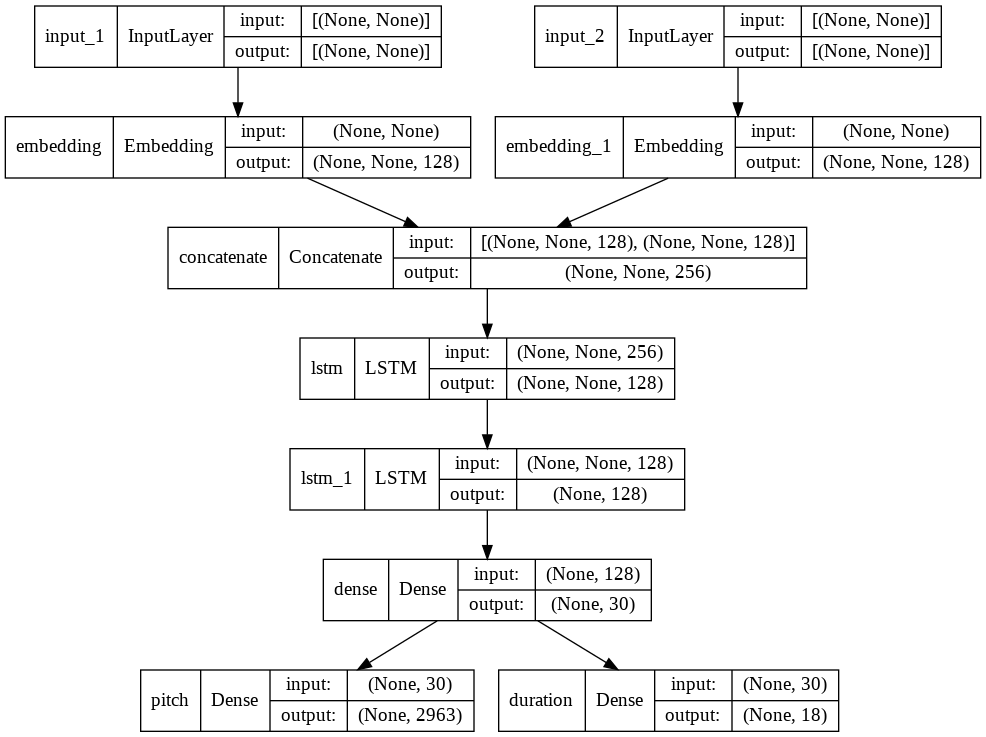

In [85]:
import tensorflow as tf
tf.keras.utils.plot_model(model, "multi_input_model.png", show_shapes=True)

In [ ]:
history = model.fit([train_chords, train_durations], 
                    [target_chords, target_durations],
                    epochs=300, batch_size=128)


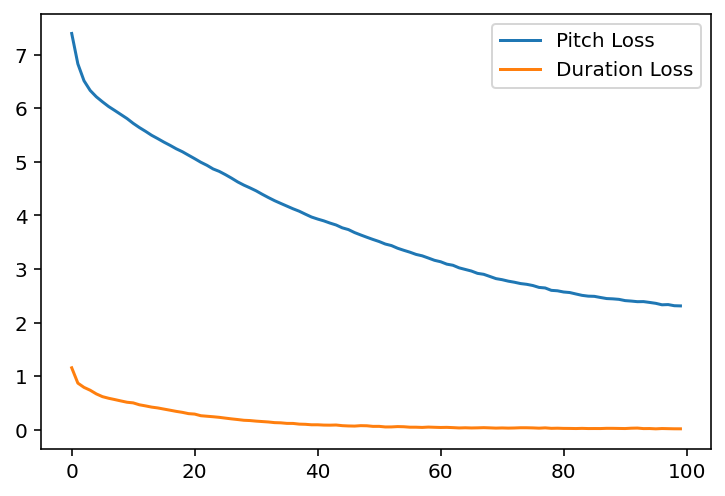

In [84]:
# get plots
plt.plot(history.history['pitch_loss'], label = 'Pitch Loss')
plt.plot(history.history['duration_loss'], label = 'Duration Loss')
plt.legend()
plt.show()

### More complex model

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


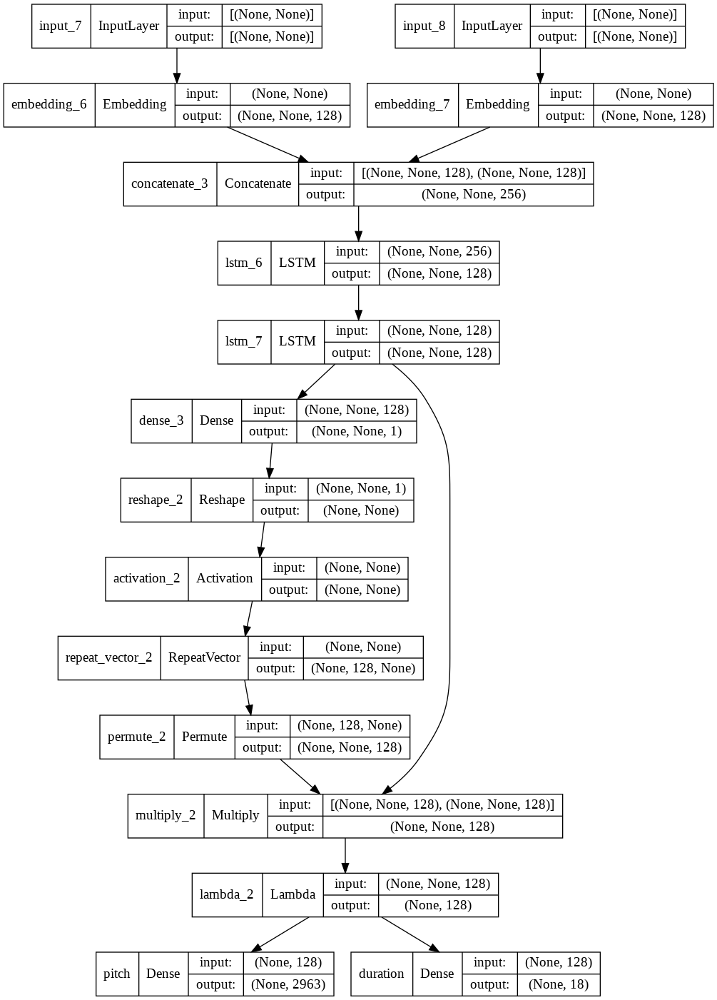

In [158]:
def create_network(n_notes, n_durations, embed_size = 100, rnn_units = 256):
    """ create the structure of the neural network """

    notes_in = Input(shape = (None,))
    durations_in = Input(shape = (None,))

    x1 = Embedding(n_notes, embed_size)(notes_in)
    x2 = Embedding(n_durations, embed_size)(durations_in) 

    x = Concatenate()([x1,x2])

    x = LSTM(rnn_units, return_sequences=True)(x)

    x = LSTM(rnn_units, return_sequences=True)(x)

    # attention
    e = Dense(1, activation='tanh')(x)
    e = Reshape([-1])(e)
    alpha = Activation('softmax')(e)

    alpha_repeated = Permute([2, 1])(RepeatVector(rnn_units)(alpha))

    c = Multiply()([x, alpha_repeated])
    c = Lambda(lambda xin: K.sum(xin, axis=1), output_shape=(rnn_units,))(c)
    
                                    
    notes_out = Dense(n_notes, activation = 'softmax', name = 'pitch')(c)
    durations_out = Dense(n_durations, activation = 'softmax', name = 'duration')(c)
   
    model = Model([notes_in, durations_in], [notes_out, durations_out])
    model.compile(loss=['sparse_categorical_crossentropy', 
                        'sparse_categorical_crossentropy'], optimizer=RMSprop(lr = 0.001))

    return model


#-----------------------
#  Hyper params
#-----------------------

embed_size = 128
rnn_units = 128

# initialize model
model_attention = create_network(n_notes, n_durations, embed_size, rnn_units)

# plot model
tf.keras.utils.plot_model(model_attention, "multi_input_model_attention.png", show_shapes=True)

In [159]:
history_2 = model_attention.fit([train_chords, train_durations], 
                                [target_chords, target_durations],
                                 epochs=300, batch_size=128)

Epoch 1/300
94/94 [==============================] - 7s 31ms/step - loss: 8.3269 - pitch_loss: 7.2941 - duration_loss: 1.0328
Epoch 2/300
94/94 [==============================] - 3s 28ms/step - loss: 7.3379 - pitch_loss: 6.6385 - duration_loss: 0.6994
Epoch 3/300
94/94 [==============================] - 3s 28ms/step - loss: 6.9908 - pitch_loss: 6.3746 - duration_loss: 0.6162
Epoch 4/300
94/94 [==============================] - 3s 28ms/step - loss: 6.7609 - pitch_loss: 6.1888 - duration_loss: 0.5721
Epoch 5/300
94/94 [==============================] - 3s 28ms/step - loss: 6.5658 - pitch_loss: 6.0351 - duration_loss: 0.5307
Epoch 6/300
94/94 [==============================] - 3s 27ms/step - loss: 6.4023 - pitch_loss: 5.9003 - duration_loss: 0.5020
Epoch 7/300
94/94 [==============================] - 3s 28ms/step - loss: 6.2424 - pitch_loss: 5.7674 - duration_loss: 0.4750
Epoch 8/300
94/94 [==============================] - 3s 28ms/step - loss: 6.0856 - pitch_loss: 5.6413 - duration_loss:

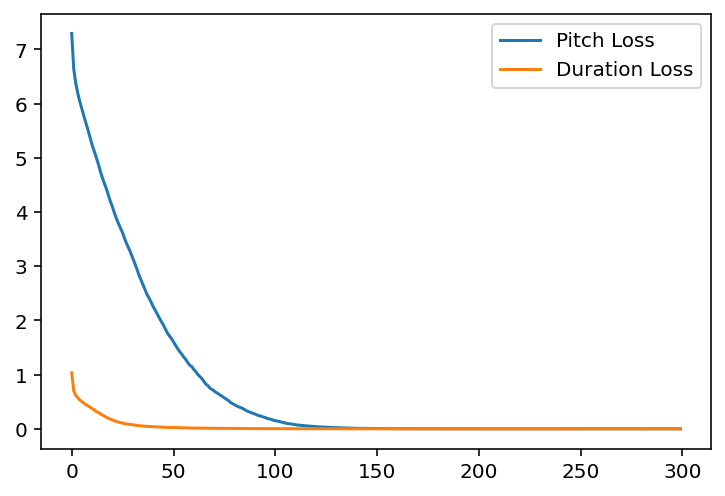

In [161]:
# get plots
plt.plot(history_2.history['pitch_loss'], label = 'Pitch Loss')
plt.plot(history_2.history['duration_loss'], label = 'Duration Loss')
plt.legend()
plt.show()

## Generate music

In [ ]:
!apt install fluidsynth
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2
!pip install midi2audio
from midi2audio import FluidSynth
from IPython.display import Audio

In [162]:
def sample_with_temp(preds, temperature):

    if temperature == 0:
        return np.argmax(preds)
    else:
        preds = np.log(preds) / temperature
        exp_preds = np.exp(preds)
        preds = exp_preds / np.sum(exp_preds)
        return np.random.choice(len(preds), p=preds)

In [163]:
# Function to predict chords and durations
def predict_chords(chord_sequence, duration_sequence,model,temperature=1.0):
    predicted_chords, predicted_durations = model.predict([chord_sequence, duration_sequence])
    return sample_with_temp(predicted_chords[0],temperature), sample_with_temp(predicted_durations[0],temperature)

In [164]:
def song_to_predict(song = 1):
    # chord and duration sequences
    initial_chords = np.expand_dims(train_chords[song,:].copy(), 0)
    initial_durations = np.expand_dims(train_durations[song,:].copy(), 0)
    return initial_chords, initial_durations

initial_chords, initial_durations = song_to_predict(song = 0)

In [165]:
def predict_new_chords(initial_chords, initial_durations,model):
    # Define empty lists for generated chords and durations
    new_chords, new_durations = [], []

    # Generate chords and durations using 50 rounds of prediction
    for j in range(50):
        new_chord, new_duration = predict_chords(initial_chords, 
                                                initial_durations,
                                                model,
                                                temperature=0.8)
        new_chords.append(new_chord)
        new_durations.append(new_duration)
        initial_chords[0][:-1] = initial_chords[0][1:]
        initial_chords[0][-1] = new_chord
        initial_durations[0][:-1] = initial_durations[0][1:]
        initial_durations[0][-1] = new_duration

    return new_chords, new_durations

new_chords, new_durations = predict_new_chords(initial_chords, initial_durations,model)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  


In [166]:
def stream_object(chords, durations, name = 'song'):
    # Create stream object 
    generated_stream = stream.Stream()
    generated_stream.append(instrument.Piano())

    # Add notes and durations to stream
    for j in range(len(chords)):
        try:
            generated_stream.append(note.Note(int_to_note[chords[j]].replace('.', ' '), 
                                              quarterType = int_to_duration[durations[j]]))
        except:
            generated_stream.append(chord.Chord(int_to_note[chords[j]].replace('.', ' '), 
                                                quarterType = int_to_duration[durations[j]]))
    song = f'{name}.mid'
    wave = f'{name}.wav'

    # Export as MIDI file
    generated_stream.write('midi', fp=song)

    # Transform to wave
    FluidSynth("font.sf2").midi_to_audio(song, wave)
    return Audio(wave)



In [172]:
# Which song to predict ?
song = 5
initial_chords, initial_durations = song_to_predict(song = song)

# Initial song 
print('Initial Song')
stream_object(list(initial_chords[0]), list(initial_durations[0]), name = 'initial_song')

Initial Song


In [173]:
new_chords, new_durations = predict_new_chords(initial_chords, initial_durations, model = model)

# Own song
print('Normal Model')
stream_object(new_chords, new_durations, name = 'lstm_song')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  


Normal Model


In [174]:
new_chords, new_durations = predict_new_chords(initial_chords, initial_durations, model = model_attention)

# Own song
print('Attention Model')
stream_object(new_chords, new_durations, name = 'lstm_song')

Attention Model
